In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

In [3]:
# 1. تثبيت أو التأكد من أحدث نسخة لـ gdown
!pip install -q --upgrade gdown

# 2. التحميل مباشرة بتمرير الـ ID فقط (أو الرابط الكامل) واستخدام -O لتحديد اسم الملف
!gdown "1iUArOsSfS9lczQWAJx_xLGCvC6qhqzKS" -O dataset.zip

# 3. فك الضغط داخل مجلد منفصل بهدوء
!mkdir -p /kaggle/working/dataset
!unzip -q dataset.zip -d /kaggle/working/dataset/

# 4. حذف ملف الـ zip لتفريغ مساحة القرص
!rm -f dataset.zip

# 5. التأكد من نجاح العملية والمساحة المتبقية
!df -h /kaggle/working
!ls -lh /kaggle/working/dataset | head -n 10

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.8/50.8 kB 1.1 MB/s eta 0:00:00ta 0:00:01
Downloading...
From (original): https://drive.google.com/uc?id=1iUArOsSfS9lczQWAJx_xLGCvC6qhqzKS
From (redirected): https://drive.google.com/uc?id=1iUArOsSfS9lczQWAJx_xLGCvC6qhqzKS&confirm=t&uuid=1e203e3b-212b-40d0-bfa7-c95418d409d2
To: /kaggle/working/dataset.zip
100%|██████████████████████████████████████| 4.08G/4.08G [00:41<00:00, 98.9MB/s]
Filesystem      Size  Used Avail Use% Mounted on
/dev/loop1       20G  4.1G   16G  21% /kaggle/working
total 1.0M
drwxr-xr-x 2 root root 4.0K May  3 00:56 catalog
drwxr-xr-x 2 root root 492K May  3 00:54 images
-rw-r--r-- 1 root root 510K May  3 00:58 metadata.csv
drwxr-xr-x 2 root root 4.0K May  3 00:54 splits
-rw-r--r-- 1 root root 5.6K May  3 01:04 Tasks_and_Classes.md


In [4]:
import os
import sys
import time
import math
import random
from pathlib import Path

import numpy as np
import pandas as pd

import cv2
from PIL import Image

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    f1_score,
    accuracy_score,
    precision_score,
    recall_score
)
from sklearn.utils.class_weight import compute_class_weight

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers, callbacks, regularizers
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess

plt.style.use('seaborn-v0_8-whitegrid' if 'seaborn-v0_8-whitegrid' in plt.style.available else 'default')
sns.set_theme(style="whitegrid")
SEED = 42
os.environ['PYTHONHASHSEED'] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.keras.utils.set_random_seed(SEED)

print(f"TensorFlow Version: {tf.__version__}")
print(f"Random seed fixed to: {SEED}")
gpus = tf.config.list_physical_devices('GPU')

if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)

        gpu_name = tf.test.gpu_device_name()
        print(f"Computation Device: GPU detected ({len(gpus)} device(s))")
        print(f"Active GPU Device Name: {gpu_name}")
        tf.keras.mixed_precision.set_global_policy('mixed_float16')
        print(f"Mixed Precision Policy enabled: {tf.keras.mixed_precision.global_policy().name}")

    except RuntimeError as e:
        print(f"Memory growth setting failed: {e}")
else:
    print("No GPU detected. TensorFlow will run on CPU.")


TensorFlow Version: 2.20.0
Random seed fixed to: 42
Computation Device: GPU detected (2 device(s))
Active GPU Device Name: /device:GPU:0
Mixed Precision Policy enabled: mixed_float16


I0000 00:00:1789757300.007246      59 gpu_device.cc:2020] Created device /device:GPU:0 with 13756 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1789757300.010802      59 gpu_device.cc:2020] Created device /device:GPU:1 with 13756 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


In [5]:
from pathlib import Path

# البحث عن ملف metadata.csv داخل /kaggle/working
matches = list(Path("/kaggle/working").rglob("metadata.csv"))

if matches:
  for m in matches:
    print(f"Found metadata at: {m}")
    print(f"Parent directory: {m.parent}")
else:
  print("metadata.csv was NOT found inside /kaggle/working.")
  # عرض المجلدات الحالية للتأكد من نجاح فك الضغط
  print(
      "Directories inside /kaggle/working:",
      [p.name for p in Path("/kaggle/working").iterdir()],
  )

Found metadata at: /kaggle/working/dataset/metadata.csv
Parent directory: /kaggle/working/dataset


In [6]:
CANDIDATE_PATHS = [
    Path("/kaggle/working/dataset/"),
]
DATA_DIR = None
for p in CANDIDATE_PATHS:
    if p.exists() and (p / "metadata.csv").exists():
        DATA_DIR = p
        break
if DATA_DIR is None:
    raise FileNotFoundError("Could not locate EyeDiseaseDataset directory. Please check your path.")
IMAGES_DIR = DATA_DIR / "images"
SPLITS_DIR = DATA_DIR / "splits"
SPLITS_DIR.mkdir(parents=True, exist_ok=True)

print(f"found Dataset at: {DATA_DIR.resolve()}")
print(f"Images Directory: {IMAGES_DIR.resolve()}")
print(f"Splits Directory: {SPLITS_DIR.resolve()}")
metadata_df = pd.read_csv(DATA_DIR / "metadata.csv")
print(f"Master Metadata loaded: {len(metadata_df)} total records.")



found Dataset at: /kaggle/working/dataset
Images Directory: /kaggle/working/dataset/images
Splits Directory: /kaggle/working/dataset/splits
Master Metadata loaded: 11839 total records.


In [7]:
metadata_df = pd.read_csv(DATA_DIR / "metadata.csv")
print(f"Master Metadata loaded: {len(metadata_df)} total records.")
metadata_df['image_path'] = metadata_df['filename'].apply(lambda x: str(IMAGES_DIR / x))
existing_mask = metadata_df['image_path'].apply(os.path.exists)
missing_count = (~existing_mask).sum()

if missing_count > 0:
    print(f"Warning: {missing_count} images in metadata were not found in {IMAGES_DIR}!")
else:
    print(f"Image Verification: All {len(metadata_df)} images verified on disk.")

Master Metadata loaded: 11839 total records.
Image Verification: All 11839 images verified on disk.


In [8]:
val_csv_path = SPLITS_DIR / "val.csv"
train_csv_path = SPLITS_DIR / "train.csv"
test_csv_path = SPLITS_DIR / "test.csv"
val_df_disk = pd.read_csv(val_csv_path)
val_filenames = set(val_df_disk['filename'])
print(f"Existing Validation split loaded: {len(val_filenames)} images.")
is_val_mask = metadata_df['filename'].isin(val_filenames)
val_df = metadata_df[is_val_mask].copy()
remaining_df = metadata_df[~is_val_mask].copy()

Existing Validation split loaded: 1197 images.


In [9]:
train_df, test_df = train_test_split(
    remaining_df,
    test_size=1199,
    stratify=remaining_df['unified_label'],
    random_state=SEED
)
train_df['split'] = 'train'
val_df['split'] = 'val'
test_df['split'] = 'test'
full_df = pd.concat([train_df, val_df, test_df], ignore_index=True)
train_df.to_csv(train_csv_path, index=False)
test_df.to_csv(test_csv_path, index=False)
full_df.to_csv(DATA_DIR / "metadata_with_splits.csv", index=False)

print(f"Train split saved ({len(train_df)} samples) -> {train_csv_path.name}")
print(f"Test split saved  ({len(test_df)} samples) -> {test_csv_path.name}")
print(f"Master with splits saved -> metadata_with_splits.csv")

Train split saved (9443 samples) -> train.csv
Test split saved  (1199 samples) -> test.csv
Master with splits saved -> metadata_with_splits.csv


In [10]:
CLASS_NAMES = sorted(full_df['unified_label'].unique())
NUM_CLASSES = len(CLASS_NAMES)
label2id = {name: idx for idx, name in enumerate(CLASS_NAMES)}
id2label = {idx: name for idx, name in enumerate(CLASS_NAMES)}
full_df['label_id'] = full_df['unified_label'].map(label2id)
print(f"\nTotal Classes ({NUM_CLASSES}):")
for name, idx in label2id.items():
    print(f"   [{idx}] {name}")
summary_table = pd.crosstab(full_df['unified_label'], full_df['split'])[['train', 'val', 'test']]
summary_table['Total'] = summary_table.sum(axis=1)
summary_table = summary_table.sort_values(by='Total', ascending=False)

print("\nDataset Distribution Across Splits:")
print(summary_table)


Total Classes (8):
   [0] AMD
   [1] Cataract
   [2] Diabetic Retinopathy
   [3] Glaucoma
   [4] Hypertension
   [5] Myopia
   [6] Normal
   [7] Others

Dataset Distribution Across Splits:
split                 train  val  test  Total
unified_label                                
Normal                 3754  467   477   4698
Diabetic Retinopathy   3272  426   415   4113
Others                  880  110   112   1102
Glaucoma                743   93    94    930
Cataract                272   34    34    340
Myopia                  234   30    30    294
AMD                     218   28    28    274
Hypertension             70    9     9     88


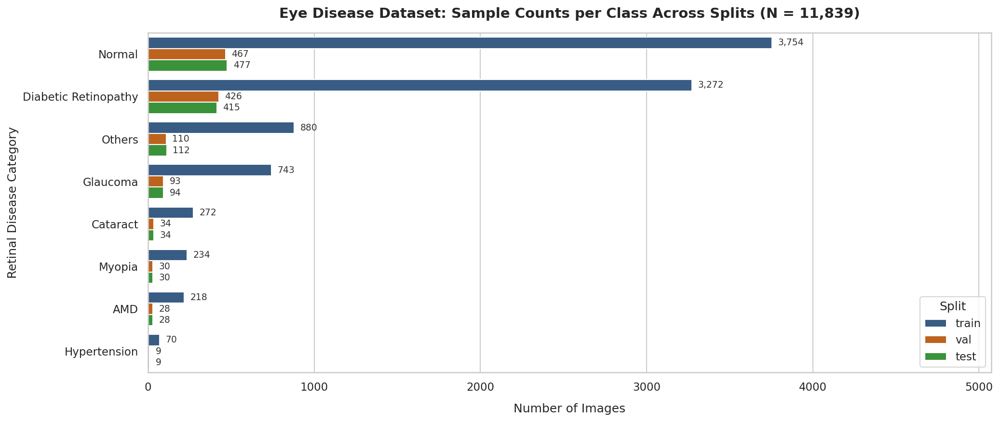

Saved class distribution plot to: class_distribution_plot.png


In [11]:
plt.figure(figsize=(14, 6), dpi=150)

class_order = full_df['unified_label'].value_counts().index

palette = {
    'train': '#2b5c8f',
    'val': '#d95f02',
    'test': '#2ca02c'
}

ax = sns.countplot(
    data=full_df,
    y='unified_label',
    hue='split',
    order=class_order,
    palette=palette
)

plt.title('Eye Disease Dataset: Sample Counts per Class Across Splits (N = 11,839)', fontsize=14, fontweight='bold', pad=15)
plt.xlabel('Number of Images', fontsize=12, labelpad=10)
plt.ylabel('Retinal Disease Category', fontsize=12)
plt.legend(title='Split', loc='lower right', frameon=True)
for p in ax.patches:
    width = p.get_width()
    if width > 0:
        ax.annotate(
            f'{int(width):,}',
            (width, p.get_y() + p.get_height() / 2.),
            ha='left', va='center',
            xytext=(6, 0), textcoords='offset points',
            fontsize=9, color='#333333'
        )

plt.xlim(0, full_df['unified_label'].value_counts().max() * 1.08)
plt.tight_layout()
dist_plot_path = DATA_DIR / "class_distribution_plot.png"
plt.savefig(dist_plot_path, bbox_inches='tight')
plt.show()
print(f"Saved class distribution plot to: {dist_plot_path.name}")


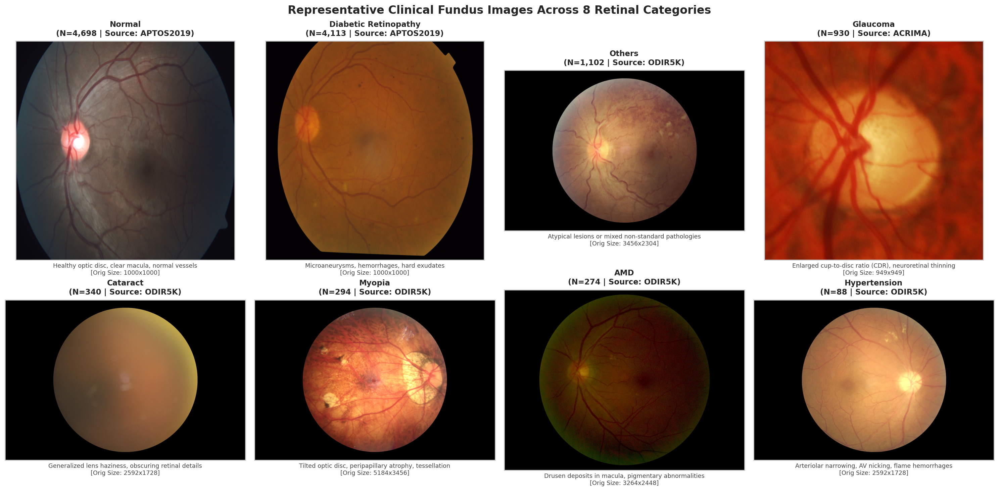

Saved sample images grid to: sample_fundus_classes.png


In [12]:
CLINICAL_SIGNS = {
    'Normal': 'Healthy optic disc, clear macula, normal vessels',
    'Diabetic Retinopathy': 'Microaneurysms, hemorrhages, hard exudates',
    'Glaucoma': 'Enlarged cup-to-disc ratio (CDR), neuroretinal thinning',
    'Cataract': 'Generalized lens haziness, obscuring retinal details',
    'AMD': 'Drusen deposits in macula, pigmentary abnormalities',
    'Hypertension': 'Arteriolar narrowing, AV nicking, flame hemorrhages',
    'Myopia': 'Tilted optic disc, peripapillary atrophy, tessellation',
    'Others': 'Atypical lesions or mixed non-standard pathologies'
}
fig, axes = plt.subplots(2, 4, figsize=(20, 10), dpi=150)
axes = axes.flatten()
for idx, class_name in enumerate(class_order):
    ax = axes[idx]
    sample_row = full_df[(full_df['unified_label'] == class_name) & (full_df['split'] == 'train')].sample(1, random_state=SEED).iloc[0]
    img_bgr = cv2.imread(sample_row['image_path'])

    if img_bgr is not None:
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        ax.imshow(img_rgb)
    else:
        ax.text(0.5, 0.5, 'Image Not Found', ha='center', va='center')
    h, w = img_bgr.shape[:2] if img_bgr is not None else (0, 0)
    total_samples = len(full_df[full_df['unified_label'] == class_name])
    ax.set_title(
        f"{class_name}\n(N={total_samples:,} | Source: {sample_row['dataset']})",
        fontsize=11, fontweight='bold', pad=8
    )
    ax.set_xlabel(f"{CLINICAL_SIGNS.get(class_name, '')}\n[Orig Size: {w}x{h}]", fontsize=8.5, color='#444444')
    ax.set_xticks([])
    ax.set_yticks([])
plt.suptitle("Representative Clinical Fundus Images Across 8 Retinal Categories", fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
samples_plot_path = DATA_DIR / "sample_fundus_classes.png"
plt.savefig(samples_plot_path, bbox_inches='tight')
plt.show()
print(f"Saved sample images grid to: {samples_plot_path.name}")

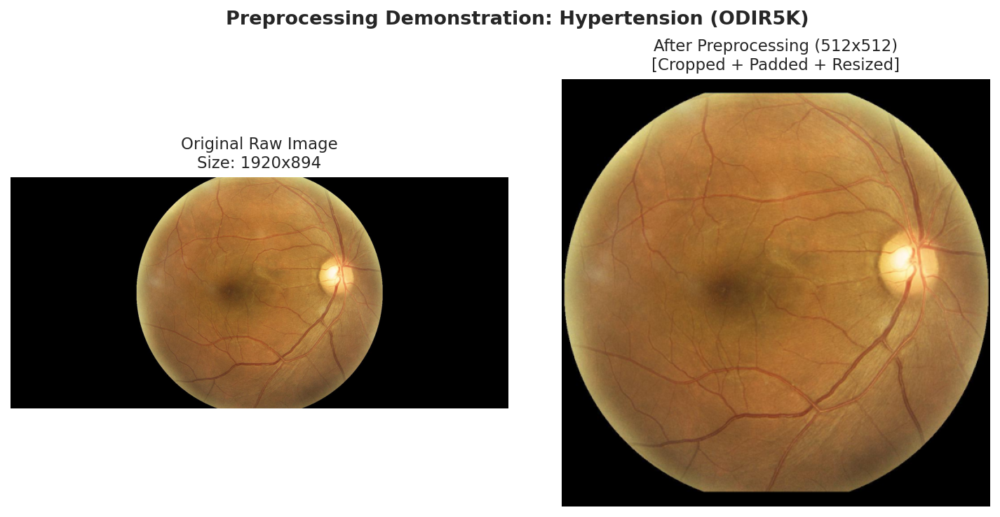


⚖️ Class Imbalance Mitigation: Effective Number of Samples Weights (beta=0.999):
-----------------------------------------------------------------
Class ID   Class Name               Train Count    Loss Weight 
-----------------------------------------------------------------
0          AMD                      218            1.1815      
1          Cataract                 272            0.9718      
2          Diabetic Retinopathy     3272           0.2406      
3          Glaucoma                 743            0.4414      
4          Hypertension             70             3.4229      
5          Myopia                   234            1.1092      
6          Normal                   3754           0.2371      
7          Others                   880            0.3955      
-----------------------------------------------------------------
Loss weights dictionary ready for model.fit(class_weight=class_weight_dict)


In [13]:
train_df['label_id'] = train_df['unified_label'].map(label2id)
val_df['label_id'] = val_df['unified_label'].map(label2id)
test_df['label_id'] = test_df['unified_label'].map(label2id)


def crop_fundus_circle(img_bgr, tol=15):
    """
    Crops out uninformative black borders surrounding the circular retinal fundus.
    """
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    mask = gray > tol
    if not np.any(mask):
        return img_bgr

    coords = np.argwhere(mask)
    y0, x0 = coords.min(axis=0)
    y1, x1 = coords.max(axis=0) + 1
    return img_bgr[y0:y1, x0:x1]

def preprocess_fundus_image(img_bgr, target_size=(512, 512)):
    """
    1. Crops black borders.
    2. Pads to square preserving aspect ratio (prevents squashing optic disc).
    3. Resizes to target_size (512x512).
    """
    cropped = crop_fundus_circle(img_bgr)
    h, w = cropped.shape[:2]
    max_dim = max(h, w)

    padded = np.zeros((max_dim, max_dim, 3), dtype=np.uint8)
    dy = (max_dim - h) // 2
    dx = (max_dim - w) // 2
    padded[dy:dy + h, dx:dx + w] = cropped

    interp = cv2.INTER_AREA if max_dim > target_size[0] else cv2.INTER_LINEAR
    resized = cv2.resize(padded, target_size, interpolation=interp)
    return resized

test_sample = full_df[full_df['unified_label'] == 'Hypertension'].iloc[0]
raw_img_bgr = cv2.imread(test_sample['image_path'])

if raw_img_bgr is not None:
    processed_bgr = preprocess_fundus_image(raw_img_bgr, target_size=(512, 512))

    fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=150)
    axes[0].imshow(cv2.cvtColor(raw_img_bgr, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f"Original Raw Image\nSize: {raw_img_bgr.shape[1]}x{raw_img_bgr.shape[0]}", fontsize=11)
    axes[0].axis('off')

    axes[1].imshow(cv2.cvtColor(processed_bgr, cv2.COLOR_BGR2RGB))
    axes[1].set_title("After Preprocessing (512x512)\n[Cropped + Padded + Resized]", fontsize=11)
    axes[1].axis('off')

    plt.suptitle(f"Preprocessing Demonstration: {test_sample['unified_label']} ({test_sample['dataset']})", fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.show()

def compute_effective_num_weights(train_labels, num_classes, beta=0.999):
    """
    Computes smooth class weights based on effective number of samples:
    weight = (1 - beta) / (1 - beta^n)
    """
    class_counts = np.bincount(train_labels, minlength=num_classes)
    effective_num = 1.0 - np.power(beta, class_counts)
    weights = (1.0 - beta) / np.array(effective_num)

    weights = weights / np.sum(weights) * num_classes
    weight_dict = {i: float(w) for i, w in enumerate(weights)}
    return weight_dict, class_counts

train_labels = train_df['label_id'].values
class_weight_dict, train_counts = compute_effective_num_weights(train_labels, NUM_CLASSES, beta=0.999)

print("\n⚖️ Class Imbalance Mitigation: Effective Number of Samples Weights (beta=0.999):")
print("-" * 65)
print(f"{'Class ID':<10} {'Class Name':<24} {'Train Count':<14} {'Loss Weight':<12}")
print("-" * 65)
for i in range(NUM_CLASSES):
    print(f"{i:<10} {id2label[i]:<24} {train_counts[i]:<14} {class_weight_dict[i]:<12.4f}")
print("-" * 65)
print("Loss weights dictionary ready for model.fit(class_weight=class_weight_dict)")


I0000 00:00:1789757313.180086      59 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13756 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1789757313.181758      59 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13756 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Training Batches:   591
Validation Batches: 75
Test Batches:       75

Fetching a sample batch to verify shapes and augmentations...
Images Batch Shape: (16, 512, 512, 3) (dtype: <dtype: 'float16'>)
Labels Batch Shape: (16,) (dtype: <dtype: 'int32'>)
Pixel Range: Min=0.00, Max=1.05


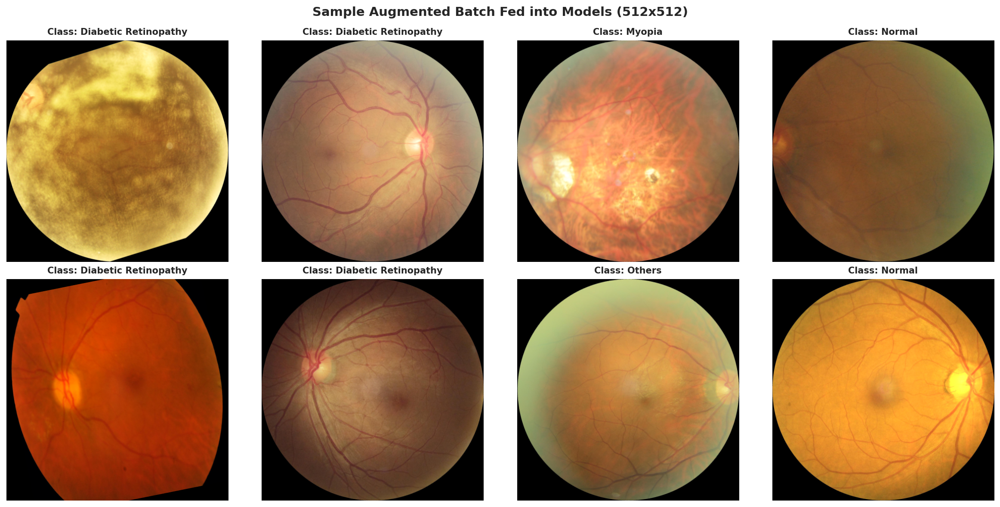

In [14]:


# ------------------------------------------------------------------------------
# 1. Hyperparameters for Data Loading
# ------------------------------------------------------------------------------
IMG_SIZE = (512, 512)
BATCH_SIZE = 16
def py_load_and_preprocess(path_bytes):
    path_str = path_bytes.numpy().decode('utf-8')
    img_bgr = cv2.imread(path_str)
    if img_bgr is None:
        img_rgb = np.zeros((*IMG_SIZE, 3), dtype=np.float32)
    else:
        processed = preprocess_fundus_image(img_bgr, target_size=IMG_SIZE)
        img_rgb = cv2.cvtColor(processed, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
    return img_rgb

def tf_process_path(img_path, label):
    [img] = tf.py_function(py_load_and_preprocess, [img_path], [tf.float32])
    img.set_shape((*IMG_SIZE, 3))
    label = tf.cast(label, tf.int32)
    return img, label

# ------------------------------------------------------------------------------
# 3. Retinal-Safe Augmentation Layer (Applied ONLY on Training Set)
# ------------------------------------------------------------------------------
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.05,fill_mode="constant",fill_value=0.0),
    layers.RandomContrast(0.10),
], name="retinal_data_augmentation")

# ------------------------------------------------------------------------------
# 4. Build Dataset Pipelines
# ------------------------------------------------------------------------------
def create_dataset(df, is_training=False, batch_size=BATCH_SIZE):
    paths = df['image_path'].values
    labels = df['label_id'].values
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    if is_training:
        ds = ds.shuffle(buffer_size=1024, seed=SEED, reshuffle_each_iteration=True)
    ds = ds.map(tf_process_path, num_parallel_calls=tf.data.AUTOTUNE)
    if is_training:
        ds = ds.batch(batch_size)
        ds = ds.map(lambda x, y: (data_augmentation(x, training=True), y),
                    num_parallel_calls=tf.data.AUTOTUNE)
    else:
        ds = ds.batch(batch_size)
    ds = ds.prefetch(tf.data.AUTOTUNE)
    return ds
train_ds = create_dataset(train_df, is_training=True, batch_size=BATCH_SIZE)
val_ds   = create_dataset(val_df, is_training=False, batch_size=BATCH_SIZE)
test_ds  = create_dataset(test_df, is_training=False, batch_size=BATCH_SIZE)
print(f"Training Batches:   {len(train_df) // BATCH_SIZE + 1}")
print(f"Validation Batches: {len(val_df) // BATCH_SIZE + 1}")
print(f"Test Batches:       {len(test_df) // BATCH_SIZE + 1}")

# ------------------------------------------------------------------------------
# 5. Visual Inspection of a Training Batch
# ------------------------------------------------------------------------------
print("\nFetching a sample batch to verify shapes and augmentations...")
sample_images, sample_labels = next(iter(train_ds))

print(f"Images Batch Shape: {sample_images.shape} (dtype: {sample_images.dtype})")
print(f"Labels Batch Shape: {sample_labels.shape} (dtype: {sample_labels.dtype})")
print(f"Pixel Range: Min={sample_images.numpy().min():.2f}, Max={sample_images.numpy().max():.2f}")
fig, axes = plt.subplots(2, 4, figsize=(16, 8), dpi=150)
axes = axes.flatten()
for i in range(8):
    ax = axes[i]
    img_to_show = np.clip(sample_images[i].numpy().astype(np.float32), 0.0, 1.0)
    ax.imshow(img_to_show)
    lbl_id = int(sample_labels[i].numpy())
    ax.set_title(f"Class: {id2label[lbl_id]}", fontsize=10, fontweight='bold')
    ax.axis('off')
plt.suptitle("Sample Augmented Batch Fed into Models (512x512)", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

In [15]:
# ==============================================================================
# Cell 6: Custom CNN Architecture from Scratch & Model Compilation
# ==============================================================================
from tensorflow.keras import layers, models, optimizers

def build_scratch_cnn(input_shape=(512, 512, 3), num_classes=NUM_CLASSES):
    """
    Constructs a 5-block deep CNN with Batch Normalization, Dropout,
    and Global Average Pooling head for 8-class retinal classification.
    """
    inputs = layers.Input(shape=input_shape, name="fundus_input")

    x = layers.Conv2D(32, (3, 3), padding="same", name="conv1")(inputs)
    x = layers.BatchNormalization(name="bn1")(x)
    x = layers.ReLU(name="relu1")(x)
    x = layers.MaxPooling2D((2, 2), name="pool1")(x)
    x = layers.Dropout(0.2, name="drop1")(x)

    x = layers.Conv2D(64, (3, 3), padding="same", name="conv2")(x)
    x = layers.BatchNormalization(name="bn2")(x)
    x = layers.ReLU(name="relu2")(x)
    x = layers.MaxPooling2D((2, 2), name="pool2")(x)
    x = layers.Dropout(0.2, name="drop2")(x)

    x = layers.Conv2D(128, (3, 3), padding="same", name="conv3")(x)
    x = layers.BatchNormalization(name="bn3")(x)
    x = layers.ReLU(name="relu3")(x)
    x = layers.MaxPooling2D((2, 2), name="pool3")(x)
    x = layers.Dropout(0.3, name="drop3")(x)

    x = layers.Conv2D(256, (3, 3), padding="same", name="conv4")(x)
    x = layers.BatchNormalization(name="bn4")(x)
    x = layers.ReLU(name="relu4")(x)
    x = layers.MaxPooling2D((2, 2), name="pool4")(x)
    x = layers.Dropout(0.3, name="drop4")(x)

    x = layers.Conv2D(512, (3, 3), padding="same", name="conv5")(x)
    x = layers.BatchNormalization(name="bn5")(x)
    x = layers.ReLU(name="relu5")(x)
    x = layers.MaxPooling2D((2, 2), name="pool5")(x)
    x = layers.Dropout(0.4, name="drop5")(x)

    x = layers.GlobalAveragePooling2D(name="gap")(x)
    x = layers.Dense(128, activation="relu", name="dense_features")(x)
    x = layers.Dropout(0.4, name="drop_head")(x)

    outputs = layers.Dense(num_classes, activation="softmax", dtype="float32", name="predictions")(x)

    model = models.Model(inputs=inputs, outputs=outputs, name="Scratch_Fundus_CNN")
    return model

# ------------------------------------------------------------------------------
# Build & Compile Scratch Model
# ------------------------------------------------------------------------------
scratch_model = build_scratch_cnn(input_shape=(512, 512, 3), num_classes=NUM_CLASSES)
scratch_optimizer = optimizers.AdamW(learning_rate=1e-3, weight_decay=1e-4)

scratch_model.compile(
    optimizer=scratch_optimizer,
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=[tf.keras.metrics.SparseCategoricalAccuracy(name="accuracy")]
)
scratch_model.summary()


Model: "Scratch_Fundus_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ fundus_input (InputLayer)       │ (None, 512, 512, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 512, 512, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1 (BatchNormalization)        │ (None, 512, 512, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu1 (ReLU)                    │ (None, 512, 512, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop1 (Dropout)                 │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 256, 256, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn2 (BatchNormalization)        │ (None, 256, 256, 64)   │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu2 (ReLU)                    │ (None, 256, 256, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop2 (Dropout)                 │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 128, 128, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn3 (BatchNormalization)        │ (None, 128, 128, 128)  │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu3 (ReLU)                    │ (None, 128, 128, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop3 (Dropout)                 │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv4 (Conv2D)                  │ (None, 64, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn4 (BatchNormalization)        │ (None, 64, 64, 256)    │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu4 (ReLU)                    │ (None, 64, 64, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool4 (MaxPooling2D)            │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop4 (Dropout)                 │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv5 (Conv2D)                  │ (None, 32, 32, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn5 (BatchNormalization)        │ (None, 32, 32, 512)    │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu5 (ReLU)                    │ (None, 32, 32, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool5 (MaxPooling2D)            │ (None, 16, 16, 512)    │             

 Total params: 1,639,240 (6.25 MB)

 Trainable params: 1,637,256 (6.25 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [16]:
# ==============================================================================
# Cell 7: Training Custom Scratch CNN & Plotting Loss/Accuracy Convergence
# ==============================================================================
import time
import matplotlib.pyplot as plt
from tensorflow.keras import callbacks
checkpoint_path = DATA_DIR / "best_scratch_cnn.keras"

scratch_callbacks = [
    callbacks.ModelCheckpoint(
        filepath=str(checkpoint_path),
        monitor="val_loss",
        save_best_only=True,
        mode="min",
        verbose=1
    ),
    callbacks.ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.5,
        patience=2,
        min_lr=1e-6,
        verbose=1
    ),
    callbacks.EarlyStopping(
        monitor="val_loss",
        patience=5,
        restore_best_weights=True,
        verbose=1
    )
]
EPOCHS_SCRATCH = 12
print(f"Starting Scratch CNN training for {EPOCHS_SCRATCH} epochs on GPU...")
start_time = time.time()
scratch_history = scratch_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS_SCRATCH,
    class_weight=class_weight_dict,
    callbacks=scratch_callbacks,
    verbose=1
)
training_duration = (time.time() - start_time) / 60.0
print(f"\nTraining finished in {training_duration:.2f} minutes.")
print(f"Best Scratch CNN weights saved to: {checkpoint_path.name}")


Starting Scratch CNN training for 12 epochs on GPU...
Epoch 1/12


2026-09-18 18:49:15.631393: E external/local_xla/xla/service/slow_operation_alarm.cc:73] Trying algorithm eng19{k2=0} for conv (f16[128,3,3,64]{3,2,1,0}, u8[0]{0}) custom-call(f16[16,128,128,64]{3,2,1,0}, f16[16,128,128,128]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=b01f_o01i->b01f, custom_call_target="__cudnn$convBackwardFilter", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]} is taking a while...
2026-09-18 18:49:18.606965: E external/local_xla/xla/service/slow_operation_alarm.cc:140] The operation took 3.975737869s
Trying algorithm eng19{k2=0} for conv (f16[128,3,3,64]{3,2,1,0}, u8[0]{0}) custom-call(f16[16,128,128,64]{3,2,1,0}, f16[16,128,128,128]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=b01f_o01i->b01f, custom_call_target="__cudnn$convBackwardFilter", backend_confi

  1/591 ━━━━━━━━━━━━━━━━━━━━ 8:12:56 50s/step - accuracy: 0.3125 - loss: 0.6637

I0000 00:00:1789757372.724036     156 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


591/591 ━━━━━━━━━━━━━━━━━━━━ 0s 898ms/step - accuracy: 0.3730 - loss: 0.7365
Epoch 1: val_loss improved from None to 1.74781, saving model to /kaggle/working/dataset/best_scratch_cnn.keras

Epoch 1: finished saving model to /kaggle/working/dataset/best_scratch_cnn.keras
591/591 ━━━━━━━━━━━━━━━━━━━━ 626s 977ms/step - accuracy: 0.4016 - loss: 0.6800 - val_accuracy: 0.2966 - val_loss: 1.7478 - learning_rate: 0.0010
Epoch 2/12
590/591 ━━━━━━━━━━━━━━━━━━━━ 0s 873ms/step - accuracy: 0.4368 - loss: 0.6510
Epoch 2: val_loss improved from 1.74781 to 1.41187, saving model to /kaggle/working/dataset/best_scratch_cnn.keras

Epoch 2: finished saving model to /kaggle/working/dataset/best_scratch_cnn.keras
591/591 ━━━━━━━━━━━━━━━━━━━━ 558s 941ms/step - accuracy: 0.4382 - loss: 0.6352 - val_accuracy: 0.4703 - val_loss: 1.4119 - learning_rate: 0.0010
Epoch 3/12
590/591 ━━━━━━━━━━━━━━━━━━━━ 0s 868ms/step - accuracy: 0.4251 - loss: 0.6344
Epoch 3: val_loss did not improve from 1.41187
591/591 ━━━━━━━━━━━

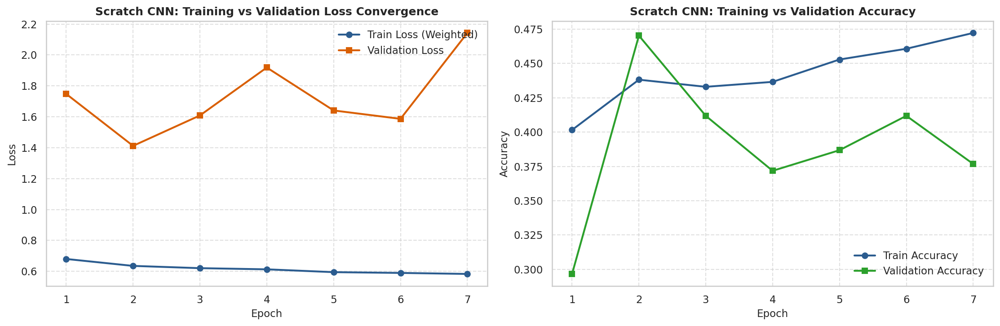

Saved convergence plot to: scratch_cnn_convergence.png


In [19]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5), dpi=150)
epochs_range = range(1, len(scratch_history.history['loss']) + 1)
ax1.plot(epochs_range, scratch_history.history['loss'], 'o-', label='Train Loss (Weighted)', color='#2b5c8f', lw=2)
ax1.plot(epochs_range, scratch_history.history['val_loss'], 's-', label='Validation Loss', color='#d95f02', lw=2)
ax1.set_title('Scratch CNN: Training vs Validation Loss Convergence', fontsize=12, fontweight='bold')
ax1.set_xlabel('Epoch', fontsize=11)
ax1.set_ylabel('Loss', fontsize=11)
ax1.legend(loc='upper right')
ax1.grid(True, linestyle='--', alpha=0.6)
ax2.plot(epochs_range, scratch_history.history['accuracy'], 'o-', label='Train Accuracy', color='#2b5c8f', lw=2)
ax2.plot(epochs_range, scratch_history.history['val_accuracy'], 's-', label='Validation Accuracy', color='#2ca02c', lw=2)
ax2.set_title('Scratch CNN: Training vs Validation Accuracy', fontsize=12, fontweight='bold')
ax2.set_xlabel('Epoch', fontsize=11)
ax2.set_ylabel('Accuracy', fontsize=11)
ax2.legend(loc='lower right')
ax2.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
conv_plot_path = DATA_DIR / "scratch_cnn_convergence.png"
fig.savefig(conv_plot_path, bbox_inches='tight')
plt.show()
print(f"Saved convergence plot to: {conv_plot_path.name}")

📦 Loading best Scratch CNN model from: /kaggle/working/dataset/best_scratch_cnn.keras ...
✅ Model successfully loaded!

🔍 Running inference on 1,199 Test samples...
✅ Finished test inference in 43.64 seconds.

📊 SCRATCH CNN: QUANTITATIVE PERFORMANCE SUMMARY (TEST SET)
   Overall Accuracy:        46.79%
   Balanced Accuracy:       20.65%
   Macro-Averaged F1-Score: 0.2055  <-- Clinical Benchmark Metric
   Weighted F1-Score:       0.4166

📋 Per-Class Classification Report:
                      precision    recall  f1-score   support

                 AMD     0.0000    0.0000    0.0000        28
            Cataract     0.0000    0.0000    0.0000        34
Diabetic Retinopathy     0.4038    0.8145    0.5399       415
            Glaucoma     0.7826    0.3830    0.5143        94
        Hypertension     0.0000    0.0000    0.0000         9
              Myopia     0.6667    0.0667    0.1212        30
              Normal     0.5911    0.3878    0.4684       477
              Others     0.

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/m

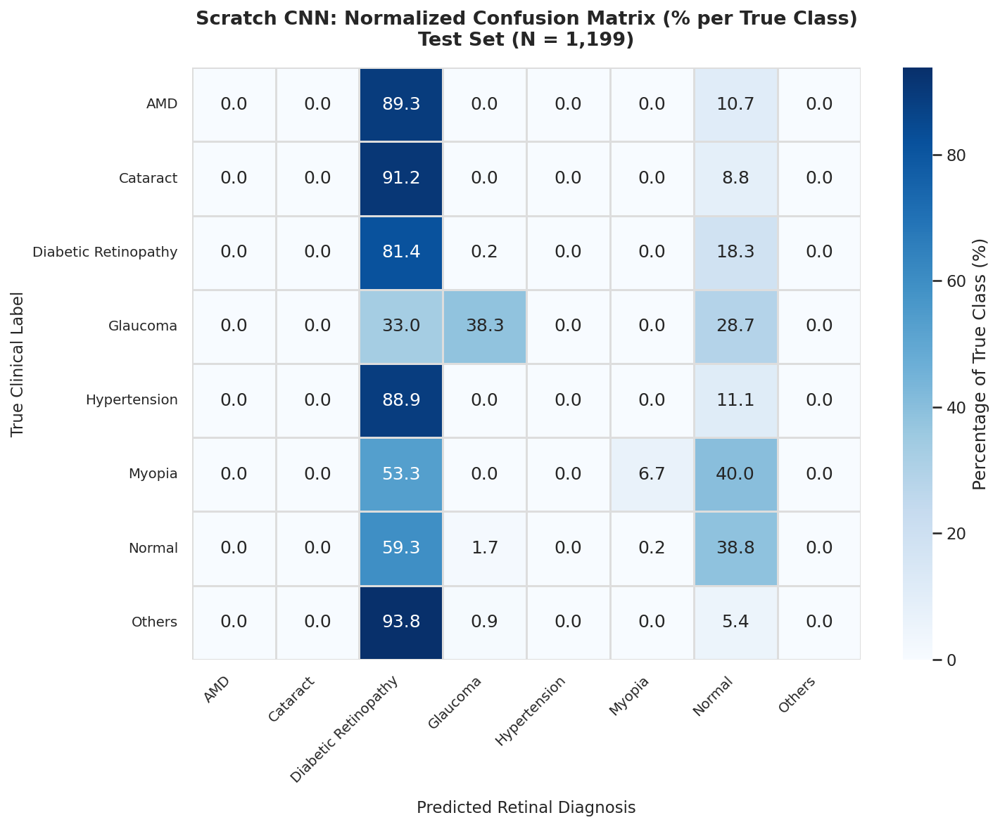

✅ Saved Normalized Confusion Matrix to: scratch_confusion_matrix.png

⏱️ Benchmarking Inference Latency for Real-Time Clinical Deployment...
   Parameters:          1.64 Million
   Disk Storage:        31.37 MB
   Avg Latency (GPU):   3.07 ± 0.15 ms per image
   Throughput (FPS):    325.2 frames/sec


In [18]:
# ==============================================================================
# Cell 8: Comprehensive Clinical Evaluation & Real-Time Benchmarking (Scratch CNN)
# ==============================================================================
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    classification_report,.
    confusion_matrix,
    f1_score,
    accuracy_score,
    balanced_accuracy_score
)
import tensorflow as tf

# ------------------------------------------------------------------------------
# 1. Load the Best Saved Scratch CNN Model Checkpoint
# ------------------------------------------------------------------------------
print(f"📦 Loading best Scratch CNN model from: {checkpoint_path} ...")
best_scratch_model = tf.keras.models.load_model(str(checkpoint_path))
print("✅ Model successfully loaded!")

# ------------------------------------------------------------------------------
# 2. Extract Ground Truth Labels & Run Inference on Unseen Test Set
# ------------------------------------------------------------------------------
print("\n🔍 Running inference on 1,199 Test samples...")

y_true = []
y_pred_probs = []

start_eval_time = time.time()
for images, labels in test_ds:
    probs = best_scratch_model.predict_on_batch(images)
    y_pred_probs.append(probs)
    y_true.extend(labels.numpy())

total_eval_time = time.time() - start_eval_time
y_true = np.array(y_true)
y_pred_probs = np.vstack(y_pred_probs)
y_pred = np.argmax(y_pred_probs, axis=1)

print(f"✅ Finished test inference in {total_eval_time:.2f} seconds.")

# ------------------------------------------------------------------------------
# 3. Compute Quantitative Metrics (Per-class & Macro)
# ------------------------------------------------------------------------------
test_acc = accuracy_score(y_true, y_pred)
balanced_acc = balanced_accuracy_score(y_true, y_pred)
macro_f1 = f1_score(y_true, y_pred, average='macro')
weighted_f1 = f1_score(y_true, y_pred, average='weighted')

print("\n" + "=" * 75)
print("📊 SCRATCH CNN: QUANTITATIVE PERFORMANCE SUMMARY (TEST SET)")
print("=" * 75)
print(f"   Overall Accuracy:        {test_acc * 100:.2f}%")
print(f"   Balanced Accuracy:       {balanced_acc * 100:.2f}%")
print(f"   Macro-Averaged F1-Score: {macro_f1:.4f}  <-- Clinical Benchmark Metric")
print(f"   Weighted F1-Score:       {weighted_f1:.4f}")
print("=" * 75)

# Detailed Classification Report
report_dict = classification_report(
    y_true, 
    y_pred, 
    target_names=CLASS_NAMES, 
    digits=4, 
    output_dict=True
)
report_df = pd.DataFrame(report_dict).transpose()

print("\n📋 Per-Class Classification Report:")
print(classification_report(y_true, y_pred, target_names=CLASS_NAMES, digits=4))

# ------------------------------------------------------------------------------
# 4. Plot Normalized Confusion Matrix (Clinical Diagnostic Dissection)
# ------------------------------------------------------------------------------
cm = confusion_matrix(y_true, y_pred, normalize='true')

plt.figure(figsize=(10, 8), dpi=150)
sns.heatmap(
    cm * 100, 
    annot=True, 
    fmt=".1f", 
    cmap="Blues", 
    xticklabels=CLASS_NAMES, 
    yticklabels=CLASS_NAMES,
    cbar_kws={'label': 'Percentage of True Class (%)'},
    linewidths=0.5,
    linecolor='#dddddd'
)
plt.title("Scratch CNN: Normalized Confusion Matrix (% per True Class)\nTest Set (N = 1,199)", 
          fontsize=13, fontweight='bold', pad=15)
plt.xlabel("Predicted Retinal Diagnosis", fontsize=11, labelpad=10)
plt.ylabel("True Clinical Label", fontsize=11)
plt.xticks(rotation=45, ha="right", fontsize=9.5)
plt.yticks(rotation=0, fontsize=9.5)
plt.tight_layout()

cm_path = DATA_DIR / "scratch_confusion_matrix.png"
plt.savefig(cm_path, bbox_inches='tight')
plt.show()
print(f"✅ Saved Normalized Confusion Matrix to: {cm_path.name}")

# ------------------------------------------------------------------------------
# 5. Real-Time Deployment Benchmarking (Latency & FPS on Single Images)
# ------------------------------------------------------------------------------
print("\n⏱️ Benchmarking Inference Latency for Real-Time Clinical Deployment...")

# Warm up GPU with a dummy sample
dummy_sample = np.zeros((1, 512, 512, 3), dtype=np.float32)
for _ in range(10):
    _ = best_scratch_model.predict_on_batch(dummy_sample)

# Measure average latency over 100 iterations (Batch Size = 1)
N_BENCHMARK = 100
latencies = []
for _ in range(N_BENCHMARK):
    t0 = time.perf_counter()
    _ = best_scratch_model.predict_on_batch(dummy_sample)
    latencies.append((time.perf_counter() - t0) * 1000.0)  # ms

avg_latency_ms = np.mean(latencies)
std_latency_ms = np.std(latencies)
fps = 1000.0 / avg_latency_ms

# Measure model size on disk
import os
model_size_mb = os.path.getsize(str(checkpoint_path)) / (1024 * 1024)
param_count_m = best_scratch_model.count_params() / 1e6

print(f"   Parameters:          {param_count_m:.2f} Million")
print(f"   Disk Storage:        {model_size_mb:.2f} MB")
print(f"   Avg Latency (GPU):   {avg_latency_ms:.2f} ± {std_latency_ms:.2f} ms per image")
print(f"   Throughput (FPS):    {fps:.1f} frames/sec")

# Store results for Cell 10 comparative analysis
scratch_results = {
    "Model": "Custom Scratch CNN",
    "Parameters (M)": f"{param_count_m:.2f}M",
    "Model Size (MB)": f"{model_size_mb:.2f} MB",
    "Overall Accuracy": f"{test_acc * 100:.2f}%",
    "Balanced Accuracy": f"{balanced_acc * 100:.2f}%",
    "Macro F1-Score": f"{macro_f1:.4f}",
    "Latency (ms)": f"{avg_latency_ms:.2f} ms",
    "Throughput (FPS)": f"{fps:.1f} FPS"
}


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
✅ ResNet50 base loaded with ImageNet weights.
   Total parameters:     24.12 Million
   Trainable parameters: 0.53 Million (Classifier Head only)

🚀 PHASE 1: WARMUP TRAINING (Training Classifier Head Only - 3 Epochs)
Epoch 1/3
591/591 ━━━━━━━━━━━━━━━━━━━━ 0s 853ms/step - accuracy: 0.4897 - loss: 0.7900
Epoch 1: val_loss improved from None to 1.14177, saving model to /kaggle/working/dataset/best_resnet50.keras

Epoch 1: finished saving model to /kaggle/working/dataset/best_resnet50.keras
591/591 ━━━━━━━━━━━━━━━━━━━━ 590s 952ms/step - accuracy: 0.5335 - loss: 0.6893 - val_accuracy: 0.6157 - val_loss: 1.1418 - learning_rate: 0.0010
Epoch 2/3
590/591 ━━━━━━━━━━━━━━━━━━━━ 0s 867ms/step - accuracy: 0.5831 - loss: 0.4909
Epoch 2: val_loss improved from 1.14177 to 0.98524, saving model to /kaggle/working/dataset/best_resnet50.keras

Epoch 2: finished saving model to /kaggle/working/dataset/best_resnet50.keras
591/591 ━━━━━━━━━━━━━━━━━━━━ 557s 

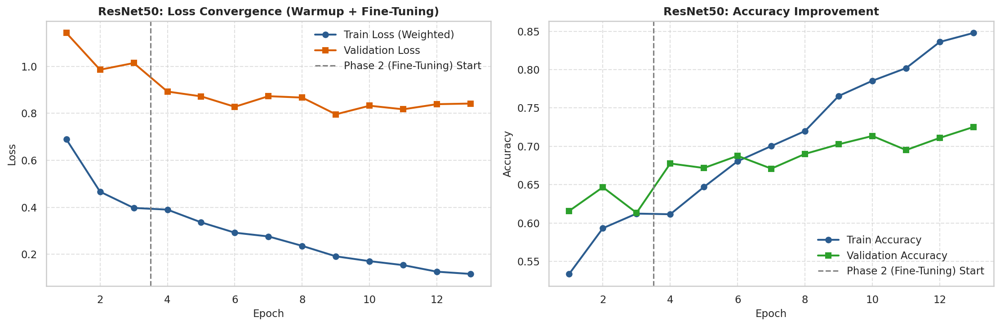


✅ Training complete! Best ResNet50 weights saved to: best_resnet50.keras
✅ Saved convergence plot to: resnet50_convergence.png


In [20]:
# ==============================================================================
# Cell 9: Pretrained Transfer Learning (ResNet50) - Two-Phase Fine-Tuning
# ==============================================================================
import time
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, callbacks
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess

# ------------------------------------------------------------------------------
# 1. Build ResNet50 Transfer Learning Architecture
# ------------------------------------------------------------------------------
def build_resnet50_model(input_shape=(512, 512, 3), num_classes=NUM_CLASSES):
    """
    Builds a two-stage ResNet50 architecture with ImageNet weights
    and a custom clinical classification head.
    """
    inputs = layers.Input(shape=input_shape, name="fundus_input")
    
    # Preprocess inputs from [0, 1] to ImageNet BGR mean-centered distribution
    x = layers.Lambda(lambda img: resnet_preprocess(img * 255.0), name="resnet_preprocessor")(inputs)
    
    # Load ResNet50 pre-trained on ImageNet
    base_model = ResNet50(
        include_top=False,
        weights="imagenet",
        input_tensor=x
    )
    
    # Initially freeze all backbone feature extraction layers
    base_model.trainable = False
    
    # Retinal Diagnostic Classification Head
    x = layers.GlobalAveragePooling2D(name="gap_head")(base_model.output)
    x = layers.BatchNormalization(name="bn_head")(x)
    x = layers.Dense(256, activation="relu", name="dense_features_head")(x)
    x = layers.Dropout(0.4, name="dropout_head")(x)
    
    # Softmax output (float32 for mixed precision numerical stability)
    outputs = layers.Dense(num_classes, activation="softmax", dtype="float32", name="predictions")(x)
    
    model = models.Model(inputs=inputs, outputs=outputs, name="Retinal_ResNet50")
    return model, base_model

resnet_model, base_resnet = build_resnet50_model(input_shape=(512, 512, 3), num_classes=NUM_CLASSES)

print("✅ ResNet50 base loaded with ImageNet weights.")
print(f"   Total parameters:     {resnet_model.count_params() / 1e6:.2f} Million")
print(f"   Trainable parameters: {sum([tf.size(w).numpy() for w in resnet_model.trainable_weights]) / 1e6:.2f} Million (Classifier Head only)")

# ------------------------------------------------------------------------------
# 2. Setup Checkpoints & Callbacks for ResNet50
# ------------------------------------------------------------------------------
resnet_checkpoint_path = DATA_DIR / "best_resnet50.keras"

resnet_callbacks = [
    callbacks.ModelCheckpoint(
        filepath=str(resnet_checkpoint_path),
        monitor="val_loss",
        save_best_only=True,
        mode="min",
        verbose=1
    ),
    callbacks.ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.5,
        patience=2,
        min_lr=1e-7,
        verbose=1
    ),
    callbacks.EarlyStopping(
        monitor="val_loss",
        patience=4,
        restore_best_weights=True,
        verbose=1
    )
]

# ==============================================================================
# PHASE 1: Classifier Head Warmup (Frozen Backbone)
# ==============================================================================
print("\n" + "=" * 75)
print("🚀 PHASE 1: WARMUP TRAINING (Training Classifier Head Only - 3 Epochs)")
print("=" * 75)

resnet_model.compile(
    optimizer=optimizers.AdamW(learning_rate=1e-3, weight_decay=1e-4),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=[tf.keras.metrics.SparseCategoricalAccuracy(name="accuracy")]
)

history_phase1 = resnet_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=3,
    class_weight=class_weight_dict,
    callbacks=resnet_callbacks,
    verbose=1
)

# ==============================================================================
# PHASE 2: Deep Fine-Tuning (Unfreezing conv5_block layers)
# ==============================================================================
print("\n" + "=" * 75)
print("🚀 PHASE 2: DEEP FINE-TUNING (Unfreezing Top Residual Blocks with Low LR)")
print("=" * 75)

# Unfreeze base model, but keep batch norm layers frozen for stability
base_resnet.trainable = True

# Fine-tune only the last stage (conv5 blocks ~ last 30 layers)
FINE_TUNE_AT = 140  # Out of 175 layers in ResNet50
for layer in base_resnet.layers[:FINE_TUNE_AT]:
    layer.trainable = False

trainable_params_phase2 = sum([tf.size(w).numpy() for w in resnet_model.trainable_weights]) / 1e6
print(f"✅ Unfrozen layers from layer {FINE_TUNE_AT} onwards.")
print(f"   Trainable parameters in Phase 2: {trainable_params_phase2:.2f} Million")

# Recompile with a very low learning rate to gently adapt deep features
resnet_model.compile(
    optimizer=optimizers.AdamW(learning_rate=5e-5, weight_decay=1e-4),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=[tf.keras.metrics.SparseCategoricalAccuracy(name="accuracy")]
)

EPOCHS_FINE_TUNE = 10
history_phase2 = resnet_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS_FINE_TUNE,
    class_weight=class_weight_dict,
    callbacks=resnet_callbacks,
    verbose=1
)

# ------------------------------------------------------------------------------
# 3. Combine Training Histories & Plot ResNet50 Convergence Curves
# ------------------------------------------------------------------------------
# Merge metrics across Phase 1 and Phase 2
combined_loss = history_phase1.history['loss'] + history_phase2.history['loss']
combined_val_loss = history_phase1.history['val_loss'] + history_phase2.history['val_loss']
combined_acc = history_phase1.history['accuracy'] + history_phase2.history['accuracy']
combined_val_acc = history_phase1.history['val_accuracy'] + history_phase2.history['val_accuracy']

epochs_total = range(1, len(combined_loss) + 1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5), dpi=150)

# Loss Convergence
ax1.plot(epochs_total, combined_loss, 'o-', label='Train Loss (Weighted)', color='#2b5c8f', lw=2)
ax1.plot(epochs_total, combined_val_loss, 's-', label='Validation Loss', color='#d95f02', lw=2)
ax1.axvline(x=3.5, color='gray', linestyle='--', label='Phase 2 (Fine-Tuning) Start')
ax1.set_title('ResNet50: Loss Convergence (Warmup + Fine-Tuning)', fontsize=12, fontweight='bold')
ax1.set_xlabel('Epoch', fontsize=11)
ax1.set_ylabel('Loss', fontsize=11)
ax1.legend(loc='upper right')
ax1.grid(True, linestyle='--', alpha=0.6)

# Accuracy Convergence
ax2.plot(epochs_total, combined_acc, 'o-', label='Train Accuracy', color='#2b5c8f', lw=2)
ax2.plot(epochs_total, combined_val_acc, 's-', label='Validation Accuracy', color='#2ca02c', lw=2)
ax2.axvline(x=3.5, color='gray', linestyle='--', label='Phase 2 (Fine-Tuning) Start')
ax2.set_title('ResNet50: Accuracy Improvement', fontsize=12, fontweight='bold')
ax2.set_xlabel('Epoch', fontsize=11)
ax2.set_ylabel('Accuracy', fontsize=11)
ax2.legend(loc='lower right')
ax2.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
resnet_plot_path = DATA_DIR / "resnet50_convergence.png"
fig.savefig(resnet_plot_path, bbox_inches='tight')
plt.show()

print(f"\n✅ Training complete! Best ResNet50 weights saved to: {resnet_checkpoint_path.name}")
print(f"✅ Saved convergence plot to: {resnet_plot_path.name}")


📦 Loading Custom Scratch CNN...
📦 Building ResNet50 graph & injecting fine-tuned weights...
✅ Successfully loaded fine-tuned ResNet50 weights!

🔍 Running evaluation for: Custom Scratch CNN on 1,199 Test samples...

🔍 Running evaluation for: Pretrained ResNet50 on 1,199 Test samples...

📋 RESNET50: PER-CLASS CLASSIFICATION REPORT (TEST SET)
                      precision    recall  f1-score   support

                 AMD     0.9048    0.6786    0.7755        28
            Cataract     0.5179    0.8529    0.6444        34
Diabetic Retinopathy     0.8496    0.6940    0.7639       415
            Glaucoma     0.6699    0.7340    0.7005        94
        Hypertension     0.3158    0.6667    0.4286         9
              Myopia     0.8750    0.9333    0.9032        30
              Normal     0.7486    0.8302    0.7873       477
              Others     0.4300    0.3839    0.4057       112

            accuracy                         0.7323      1199
           macro avg     0.6639    0

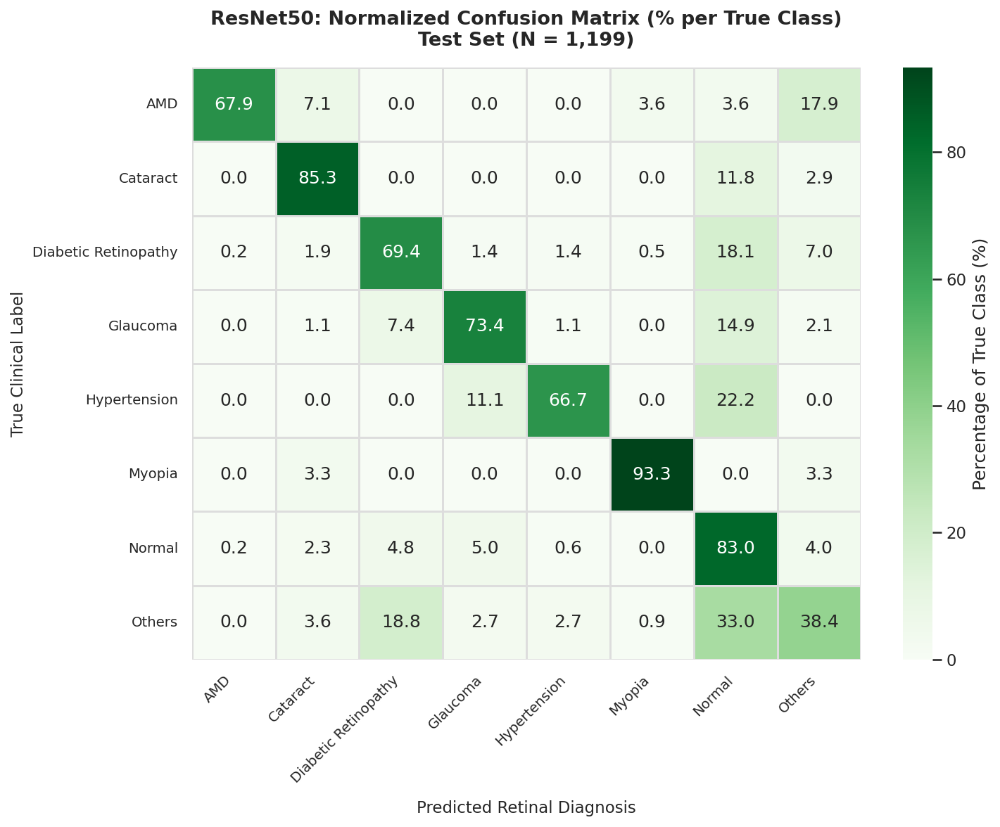

✅ Saved ResNet50 Confusion Matrix to: resnet50_confusion_matrix.png

🏆 OFFICIAL HEAD-TO-HEAD COMPARISON TABLE (PDF DELIVERABLE)
               Evaluation Metric              Custom Scratch CNN            Fine-Tuned ResNet50             Improvement (Δ)
           Architecture Backbone 5-Block Deep CNN (From Scratch) ResNet50 (ImageNet Pretrained) Transfer Learning Advantage
            Total Parameters (M)                          1.64 M                        24.12 M                    +22.48 M
            Model Disk Size (MB)                        31.37 MB                      333.39 MB                  +302.01 MB
                Overall Accuracy                          46.79%                         73.23%                     +26.44%
               Balanced Accuracy                          20.65%                         72.17%                     +51.52%
         Macro-Averaged F1-Score                          0.2055                         0.6761                     +0.4707
    

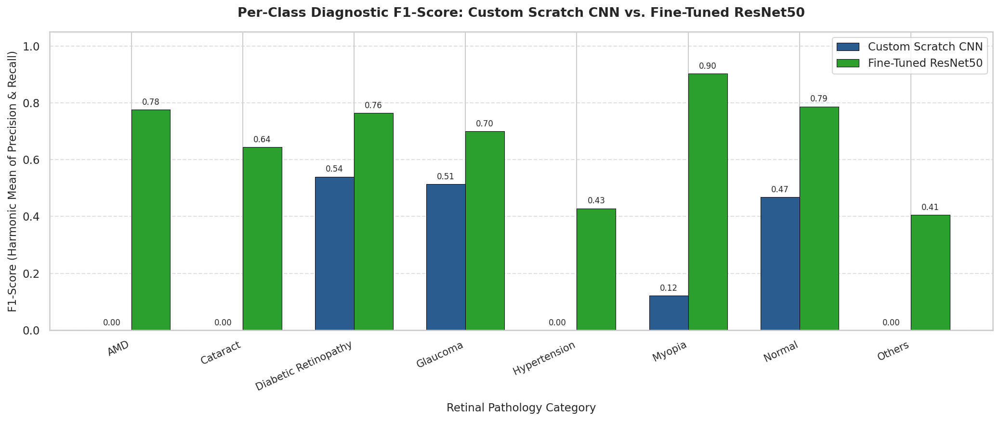

✅ Saved per-class F1 comparison chart to: per_class_f1_comparison.png


In [23]:
# ==============================================================================
# Cell 10 (Robust): Quantitative Comparison & Official Head-to-Head Benchmark
# ==============================================================================
import os
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    f1_score,
    accuracy_score,
    balanced_accuracy_score
)
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess

# ------------------------------------------------------------------------------
# 1. Model Loader Helpers (Bypasses Keras 3 Lambda Deserialization Error)
# ------------------------------------------------------------------------------
def load_scratch_model(checkpoint_path):
    print("📦 Loading Custom Scratch CNN...")
    return tf.keras.models.load_model(str(checkpoint_path))

def load_clean_resnet50(checkpoint_path, input_shape=(512, 512, 3), num_classes=NUM_CLASSES):
    print("📦 Building ResNet50 graph & injecting fine-tuned weights...")
    inputs = tf.keras.layers.Input(shape=input_shape, name="fundus_input")
    
    # Explicit output_shape to ensure full compatibility
    x = tf.keras.layers.Lambda(
        lambda img: resnet_preprocess(img * 255.0), 
        output_shape=input_shape,
        name="resnet_preprocessor"
    )(inputs)
    
    base_model = ResNet50(include_top=False, weights=None, input_tensor=x)
    
    # Retinal head matching Cell 9
    x = tf.keras.layers.GlobalAveragePooling2D(name="gap_head")(base_model.output)
    x = tf.keras.layers.BatchNormalization(name="bn_head")(x)
    x = tf.keras.layers.Dense(256, activation="relu", name="dense_features_head")(x)
    x = tf.keras.layers.Dropout(0.4, name="dropout_head")(x)
    outputs = tf.keras.layers.Dense(num_classes, activation="softmax", dtype="float32", name="predictions")(x)
    
    model = tf.keras.models.Model(inputs=inputs, outputs=outputs, name="Retinal_ResNet50")
    
    # Directly inject the trained weights from the best checkpoint
    model.load_weights(str(checkpoint_path))
    print("✅ Successfully loaded fine-tuned ResNet50 weights!")
    return model

# ------------------------------------------------------------------------------
# 2. Universal Evaluation & Benchmarking Function
# ------------------------------------------------------------------------------
def evaluate_and_benchmark(model, model_name, model_file_path, test_dataset):
    print(f"\n🔍 Running evaluation for: {model_name} on 1,199 Test samples...")
    
    y_true_list = []
    y_pred_probs_list = []
    
    for images, labels in test_dataset:
        probs = model.predict_on_batch(images)
        y_pred_probs_list.append(probs)
        y_true_list.extend(labels.numpy())
        
    y_true = np.array(y_true_list)
    y_pred_probs = np.vstack(y_pred_probs_list)
    y_pred = np.argmax(y_pred_probs, axis=1)
    
    acc = accuracy_score(y_true, y_pred)
    bal_acc = balanced_accuracy_score(y_true, y_pred)
    mac_f1 = f1_score(y_true, y_pred, average='macro', zero_division=0)
    weight_f1 = f1_score(y_true, y_pred, average='weighted', zero_division=0)
    
    clf_report = classification_report(
        y_true, 
        y_pred, 
        target_names=CLASS_NAMES, 
        output_dict=True, 
        digits=4, 
        zero_division=0
    )
    
    # Benchmarking Latency & FPS (Single Image, Batch Size = 1)
    dummy_input = np.zeros((1, 512, 512, 3), dtype=np.float32)
    for _ in range(10): # Warm up
        _ = model.predict_on_batch(dummy_input)
        
    latencies = []
    for _ in range(50):
        t0 = time.perf_counter()
        _ = model.predict_on_batch(dummy_input)
        latencies.append((time.perf_counter() - t0) * 1000.0)
        
    avg_latency = np.mean(latencies)
    fps = 1000.0 / avg_latency
    
    file_size_mb = os.path.getsize(str(model_file_path)) / (1024 * 1024)
    param_count_m = model.count_params() / 1e6
    
    return {
        "model_obj": model,
        "name": model_name,
        "y_true": y_true,
        "y_pred": y_pred,
        "accuracy": acc,
        "balanced_accuracy": bal_acc,
        "macro_f1": mac_f1,
        "weighted_f1": weight_f1,
        "report_dict": clf_report,
        "latency_ms": avg_latency,
        "fps": fps,
        "size_mb": file_size_mb,
        "params_m": param_count_m
    }

# ------------------------------------------------------------------------------
# 3. Execute Evaluation on Both Models
# ------------------------------------------------------------------------------
scratch_path = DATA_DIR / "best_scratch_cnn.keras"
resnet_path  = DATA_DIR / "best_resnet50.keras"

model_scratch = load_scratch_model(scratch_path)
model_resnet  = load_clean_resnet50(resnet_path)

scratch_eval = evaluate_and_benchmark(model_scratch, "Custom Scratch CNN", scratch_path, test_ds)
resnet_eval  = evaluate_and_benchmark(model_resnet, "Pretrained ResNet50", resnet_path, test_ds)

# ------------------------------------------------------------------------------
# 4. Print ResNet50 Classification Report
# ------------------------------------------------------------------------------
print("\n" + "=" * 80)
print("📋 RESNET50: PER-CLASS CLASSIFICATION REPORT (TEST SET)")
print("=" * 80)
print(classification_report(resnet_eval["y_true"], resnet_eval["y_pred"], target_names=CLASS_NAMES, digits=4, zero_division=0))

# ------------------------------------------------------------------------------
# 5. Plot ResNet50 Normalized Confusion Matrix
# ------------------------------------------------------------------------------
cm_resnet = confusion_matrix(resnet_eval["y_true"], resnet_eval["y_pred"], normalize='true')

plt.figure(figsize=(10, 8), dpi=150)
sns.heatmap(
    cm_resnet * 100, 
    annot=True, 
    fmt=".1f", 
    cmap="Greens", 
    xticklabels=CLASS_NAMES, 
    yticklabels=CLASS_NAMES,
    cbar_kws={'label': 'Percentage of True Class (%)'},
    linewidths=0.5,
    linecolor='#dddddd'
)
plt.title("ResNet50: Normalized Confusion Matrix (% per True Class)\nTest Set (N = 1,199)", 
          fontsize=13, fontweight='bold', pad=15)
plt.xlabel("Predicted Retinal Diagnosis", fontsize=11, labelpad=10)
plt.ylabel("True Clinical Label", fontsize=11)
plt.xticks(rotation=45, ha="right", fontsize=9.5)
plt.yticks(rotation=0, fontsize=9.5)
plt.tight_layout()

cm_res_path = DATA_DIR / "resnet50_confusion_matrix.png"
plt.savefig(cm_res_path, bbox_inches='tight')
plt.show()
print(f"✅ Saved ResNet50 Confusion Matrix to: {cm_res_path.name}")

# ------------------------------------------------------------------------------
# 6. Build Official Head-to-Head Comparison Table
# ------------------------------------------------------------------------------
comparison_data = {
    "Evaluation Metric": [
        "Architecture Backbone",
        "Total Parameters (M)",
        "Model Disk Size (MB)",
        "Overall Accuracy",
        "Balanced Accuracy",
        "Macro-Averaged F1-Score",
        "Weighted F1-Score",
        "Inference Latency (Single Image)",
        "Throughput (Frames Per Second)"
    ],
    "Custom Scratch CNN": [
        "5-Block Deep CNN (From Scratch)",
        f"{scratch_eval['params_m']:.2f} M",
        f"{scratch_eval['size_mb']:.2f} MB",
        f"{scratch_eval['accuracy'] * 100:.2f}%",
        f"{scratch_eval['balanced_accuracy'] * 100:.2f}%",
        f"{scratch_eval['macro_f1']:.4f}",
        f"{scratch_eval['weighted_f1']:.4f}",
        f"{scratch_eval['latency_ms']:.2f} ms",
        f"{scratch_eval['fps']:.1f} FPS"
    ],
    "Fine-Tuned ResNet50": [
        "ResNet50 (ImageNet Pretrained)",
        f"{resnet_eval['params_m']:.2f} M",
        f"{resnet_eval['size_mb']:.2f} MB",
        f"{resnet_eval['accuracy'] * 100:.2f}%",
        f"{resnet_eval['balanced_accuracy'] * 100:.2f}%",
        f"{resnet_eval['macro_f1']:.4f}",
        f"{resnet_eval['weighted_f1']:.4f}",
        f"{resnet_eval['latency_ms']:.2f} ms",
        f"{resnet_eval['fps']:.1f} FPS"
    ],
    "Improvement (Δ)": [
        "Transfer Learning Advantage",
        f"+{resnet_eval['params_m'] - scratch_eval['params_m']:.2f} M",
        f"+{resnet_eval['size_mb'] - scratch_eval['size_mb']:.2f} MB",
        f"+{(resnet_eval['accuracy'] - scratch_eval['accuracy']) * 100:.2f}%",
        f"+{(resnet_eval['balanced_accuracy'] - scratch_eval['balanced_accuracy']) * 100:.2f}%",
        f"+{resnet_eval['macro_f1'] - scratch_eval['macro_f1']:.4f}",
        f"+{resnet_eval['weighted_f1'] - scratch_eval['weighted_f1']:.4f}",
        f"{resnet_eval['latency_ms'] - scratch_eval['latency_ms']:+.2f} ms",
        f"{resnet_eval['fps'] - scratch_eval['fps']:+.1f} FPS"
    ]
}

comp_df = pd.DataFrame(comparison_data)

print("\n" + "=" * 90)
print("🏆 OFFICIAL HEAD-TO-HEAD COMPARISON TABLE (PDF DELIVERABLE)")
print("=" * 90)
print(comp_df.to_string(index=False))
print("=" * 90)

comp_csv_path = DATA_DIR / "model_comparison_summary.csv"
comp_df.to_csv(comp_csv_path, index=False)
print(f"✅ Saved comparison table to: {comp_csv_path.name}")

# ------------------------------------------------------------------------------
# 7. Side-by-Side Per-Class F1-Score Bar Chart
# ------------------------------------------------------------------------------
scratch_f1s = [scratch_eval['report_dict'][c]['f1-score'] for c in CLASS_NAMES]
resnet_f1s  = [resnet_eval['report_dict'][c]['f1-score'] for c in CLASS_NAMES]

x = np.arange(len(CLASS_NAMES))
width = 0.35

fig, ax = plt.subplots(figsize=(14, 6), dpi=150)
rects1 = ax.bar(x - width/2, scratch_f1s, width, label='Custom Scratch CNN', color='#2b5c8f', edgecolor='black', lw=0.5)
rects2 = ax.bar(x + width/2, resnet_f1s, width, label='Fine-Tuned ResNet50', color='#2ca02c', edgecolor='black', lw=0.5)

ax.set_title('Per-Class Diagnostic F1-Score: Custom Scratch CNN vs. Fine-Tuned ResNet50', fontsize=13, fontweight='bold', pad=15)
ax.set_xlabel('Retinal Pathology Category', fontsize=11, labelpad=10)
ax.set_ylabel('F1-Score (Harmonic Mean of Precision & Recall)', fontsize=11)
ax.set_xticks(x)
ax.set_xticklabels(CLASS_NAMES, rotation=25, ha='right', fontsize=10)
ax.set_ylim(0, 1.05)
ax.legend(loc='upper right', frameon=True)
ax.grid(axis='y', linestyle='--', alpha=0.6)

# Label values on bars
ax.bar_label(rects1, fmt='%.2f', padding=3, fontsize=8)
ax.bar_label(rects2, fmt='%.2f', padding=3, fontsize=8)

plt.tight_layout()
f1_comp_path = DATA_DIR / "per_class_f1_comparison.png"
plt.savefig(f1_comp_path, bbox_inches='tight')
plt.show()
print(f"✅ Saved per-class F1 comparison chart to: {f1_comp_path.name}")


🔬 Generating Clinical Grad-CAM Visualizations across Retinal Pathologies...


/tmp/ipykernel_59/467819132.py:55: RuntimeWarning: invalid value encountered in cast
  heatmap_uint8 = np.uint8(255 * heatmap_clipped)
/tmp/ipykernel_59/467819132.py:139: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_59/467819132.py:142: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(gradcam_gallery_path, bbox_inches='tight')


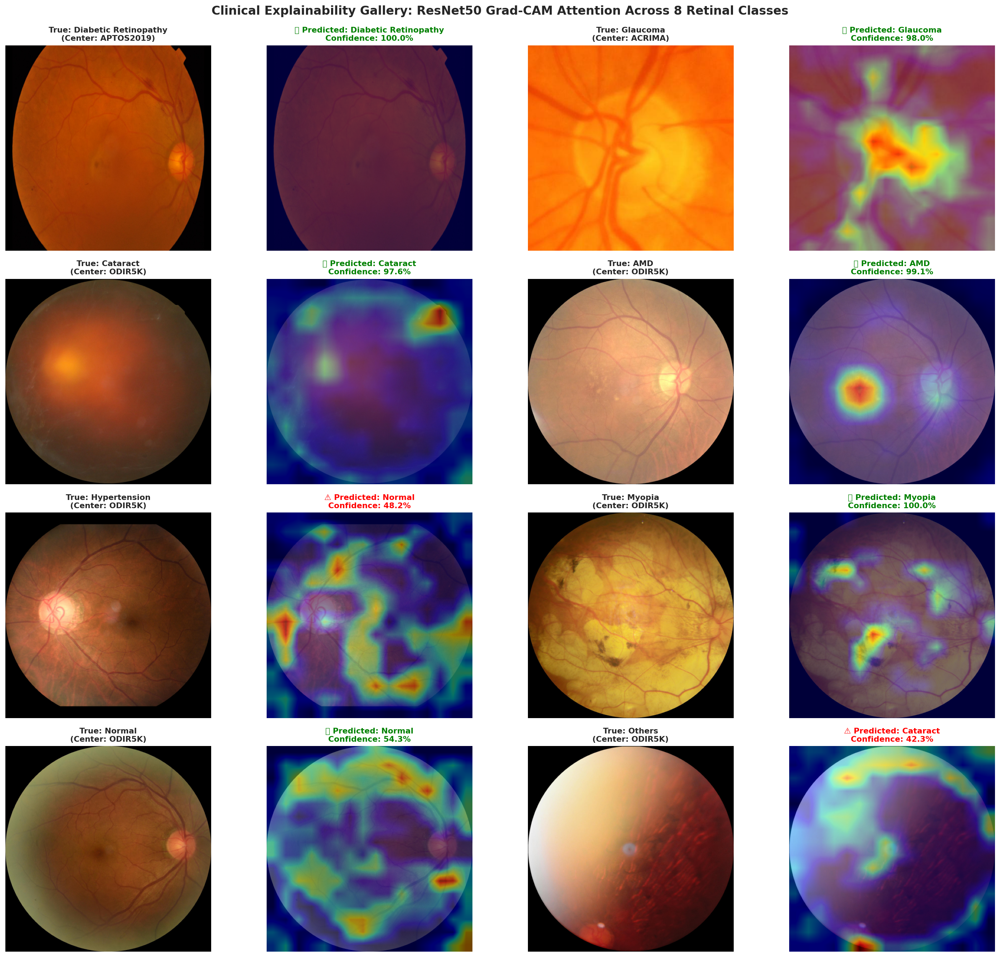

✅ Successfully generated and saved Grad-CAM Gallery to: gradcam_interpretability_gallery.png


In [28]:
# ==============================================================================
# Cell 11 (Fixed float16): Clinical Explainability (Grad-CAM Gallery)
# ==============================================================================
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# ------------------------------------------------------------------------------
# 1. Direct Single-Graph Grad-CAM Algorithm (Float32 Normalized)
# ------------------------------------------------------------------------------
def generate_gradcam_heatmap(img_array, model, last_conv_layer_name="conv5_block3_out", pred_index=None):
    """
    Direct single-forward-pass Grad-CAM ensuring float32 compatibility with OpenCV.
    """
    grad_model = tf.keras.models.Model(
        inputs=model.inputs,
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model([img_array])
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    # Gradient of top class with respect to feature map
    grads = tape.gradient(class_channel, conv_outputs)

    # Global Average Pooling across spatial dimensions
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weight the channels by gradient importance
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Apply ReLU & Normalize
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-10)
    
    # Crucial: Cast from float16 to float32 for OpenCV compatibility
    return heatmap.numpy().astype(np.float32), int(pred_index), float(predictions[0, pred_index])

def overlay_gradcam(original_img_rgb, heatmap, alpha=0.45):
    """
    Superimposes colored JET heatmap onto original fundus image.
    """
    # Ensure float32 for cv2.resize
    heatmap_f32 = np.asarray(heatmap, dtype=np.float32)
    h_target, w_target = original_img_rgb.shape[:2]
    
    # Resize heatmap to match 512x512
    heatmap_resized = cv2.resize(heatmap_f32, (w_target, h_target))
    heatmap_clipped = np.clip(heatmap_resized, 0.0, 1.0)
    heatmap_uint8 = np.uint8(255 * heatmap_clipped)

    # Apply JET colormap (Red = High Clinical Attention, Blue = Background)
    jet = plt.colormaps["jet"]
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap_uint8]
    jet_heatmap = np.uint8(jet_heatmap * 255)

    # Superimpose heatmap on original fundus
    superimposed_img = jet_heatmap * alpha + (original_img_rgb * 255.0) * (1.0 - alpha)
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)
    return superimposed_img

# ------------------------------------------------------------------------------
# 2. Generate Gallery Across All 8 Retinal Diseases
# ------------------------------------------------------------------------------
print("🔬 Generating Clinical Grad-CAM Visualizations across Retinal Pathologies...")

TARGET_DISEASES = [
    "Diabetic Retinopathy", 
    "Glaucoma", 
    "Cataract", 
    "AMD", 
    "Hypertension", 
    "Myopia", 
    "Normal", 
    "Others"
]

fig, axes = plt.subplots(4, 4, figsize=(20, 18), dpi=150)
axes = axes.flatten()

plot_idx = 0
for disease in TARGET_DISEASES:
    sample_sub = test_df[test_df['unified_label'] == disease]
    if len(sample_sub) == 0:
        continue
    sample_row = sample_sub.iloc[0]
    
    # Load and preprocess sample
    raw_bgr = cv2.imread(sample_row['image_path'])
    if raw_bgr is None:
        continue
    processed_bgr = preprocess_fundus_image(raw_bgr, target_size=(512, 512))
    img_rgb = cv2.cvtColor(processed_bgr, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
    input_tensor = np.expand_dims(img_rgb, axis=0)
    
    true_label_id = label2id[disease]
    heatmap, pred_id, confidence = generate_gradcam_heatmap(
        input_tensor, 
        model_resnet, 
        last_conv_layer_name="conv5_block3_out"
    )
    
    overlay = overlay_gradcam(img_rgb, heatmap, alpha=0.45)
    
    # 1. Original Retinal Image
    ax_orig = axes[plot_idx]
    ax_orig.imshow(img_rgb)
    ax_orig.set_title(f"True: {disease}\n(Center: {sample_row['dataset']})", fontsize=10.5, fontweight='bold')
    ax_orig.axis('off')
    
    # 2. Grad-CAM Attention Map
    ax_cam = axes[plot_idx + 1]
    ax_cam.imshow(overlay)
    status_icon = "✅" if pred_id == true_label_id else "⚠️"
    ax_cam.set_title(
        f"{status_icon} Predicted: {id2label[pred_id]}\nConfidence: {confidence * 100:.1f}%", 
        fontsize=10.5, 
        fontweight='bold',
        color="green" if pred_id == true_label_id else "red"
    )
    ax_cam.axis('off')
    
    plot_idx += 2
    if plot_idx >= 16:
        break

plt.suptitle(
    "Clinical Explainability Gallery: ResNet50 Grad-CAM Attention Across 8 Retinal Classes", 
    fontsize=16, 
    fontweight='bold', 
    y=0.99
)
plt.tight_layout()

gradcam_gallery_path = DATA_DIR / "gradcam_interpretability_gallery.png"
plt.savefig(gradcam_gallery_path, bbox_inches='tight')
plt.show()

print(f"✅ Successfully generated and saved Grad-CAM Gallery to: {gradcam_gallery_path.name}")
